In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from scipy.spatial.distance import cdist
import cv2
import sys
import pandas as pd
from IPython.display import display
from datetime import datetime

from astroquery.simbad import Simbad
from astroquery.vizier import Vizier
from photutils.aperture import ApertureStats, aperture_photometry, CircularAperture, CircularAnnulus, RectangularAperture, RectangularAnnulus
from photutils.detection import DAOStarFinder, find_peaks
from astropy.io import fits
from astropy.stats import sigma_clipped_stats
from astropy.table import vstack, Table, Column
from astropy.wcs import WCS
import astropy.units as u
from astropy.coordinates import Angle, SkyCoord

sys.path.append('/home/finn/visual_Studio_Code/bachelorarbeit/')
from phot_used_functions import filter_sources, determine_distance, determine_shift, determine_shift_aa, determine_magnitudes, determine_fwhm
from phot_used_functions import import_images
from plotting import show_image

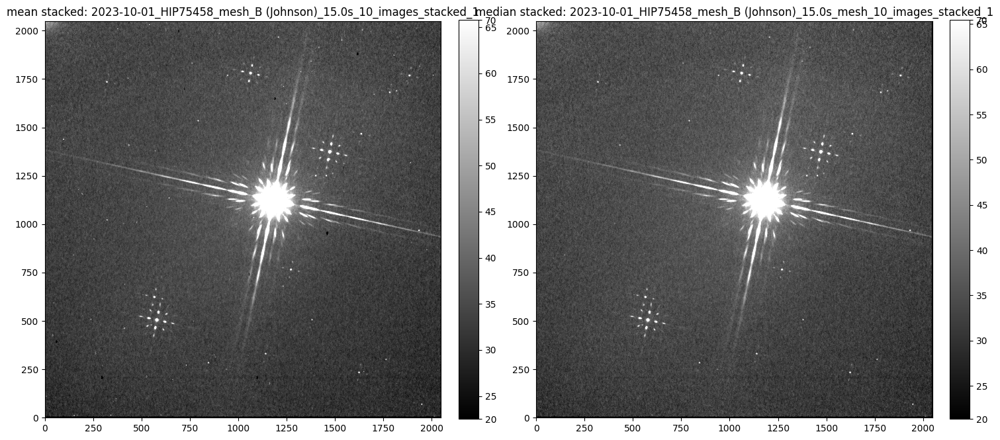

In [37]:
#path = '/home/finn/visual_Studio_Code/data/2023-10-01/stacked/lightCor_HIP75458_mesh_B (Johnson)_7.5s_10_images_stacked_0.fit'
#path_median = '/home/finn/visual_Studio_Code/data/2023-10-01/stacked_old/lightCor_HIP75458_mesh_B (Johnson)_7.5s_mesh_10_images_stacked_0.fit'
path  ='/home/finn/visual_Studio_Code/data/2023-10-01/stacked/lightCor_HIP75458_mesh_B (Johnson)_15.0s_10_images_stacked_0.fit'
path_median = '/home/finn/visual_Studio_Code/data/2023-10-01/stacked_old/lightCor_HIP75458_mesh_B (Johnson)_15.0s_mesh_10_images_stacked_0.fit'

#path         ='/home/finn/visual_Studio_Code/data/2023-09-26/stacked/lightCor_HIP100587_mesh_series_R (Johnson)_5.0s_10_images_stacked_0.fit'
#path_median  ='/home/finn/visual_Studio_Code/data/2023-09-26/stacked_old/lightCor_HIP100587_mesh_series_R (Johnson)_5.0s_10_images_stacked_0.fit'

image_list,  header_list, titles, exptime = import_images(path)
image_list_median, header_list_median, titles_median, exptime_median = import_images(path_median)

middle = len(image_list)//2
middle_image = image_list_median[middle]

w = WCS(header_list[0]) #use mean images wcs because i didnt solved for median yet


fig, ax = plt.subplots(1, 2, figsize=(15, 30))
show_image(image_list[middle], fig=fig, ax=ax[0])
show_image(middle_image , fig=fig, ax=ax[1])
ax[0].set_title(f'mean stacked: {titles[middle]}')
ax[1].set_title(f'median stacked: {titles_median[middle]}')
plt.tight_layout()

In [42]:
shifts = determine_shift(image_list_median, wanted_index=0)
print(shifts)

Number of images to process: 3
we use image:  0 from given list as reference image


[(0, 0), (0.4530242, 11.668003), (4.6997023, 19.458582)]


[-8.873985544086194, -8.86414282904646, -8.847856821495451]
-8.861995064876035 +- 0.01077457514258501
[-8.875548546966062, -8.862907747829238, -8.847609815283532]
-8.862022036692943 +- 0.011423121148787761


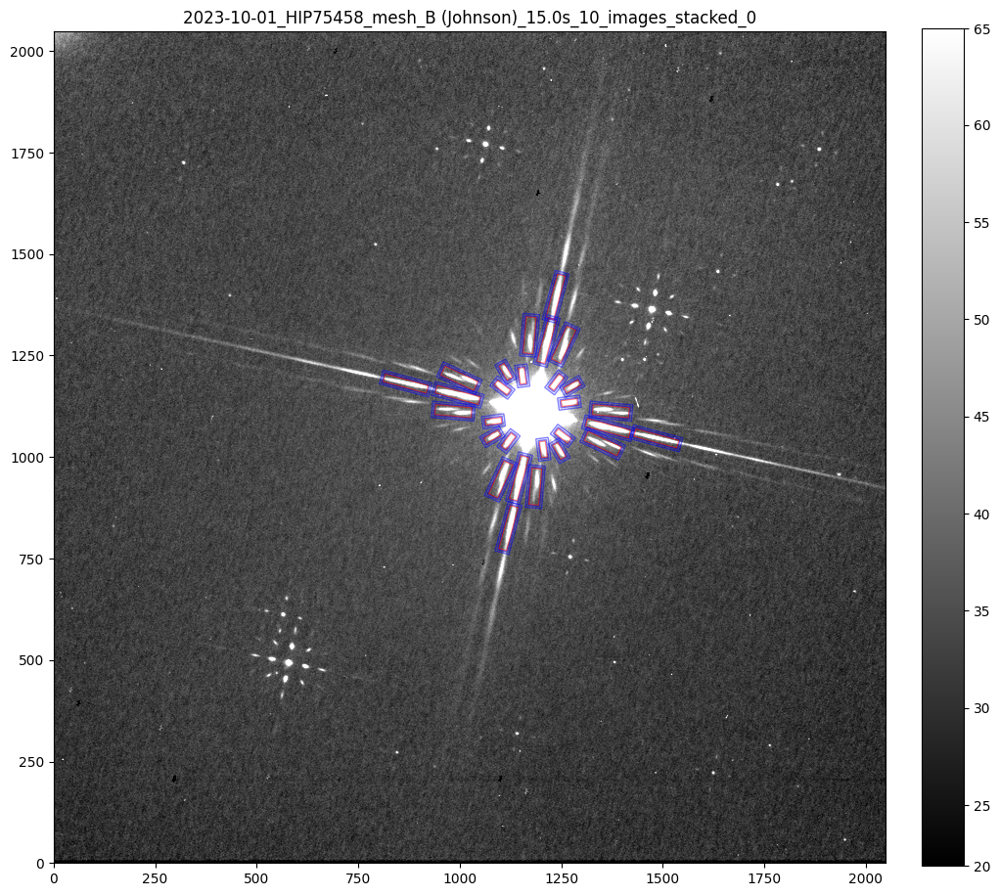

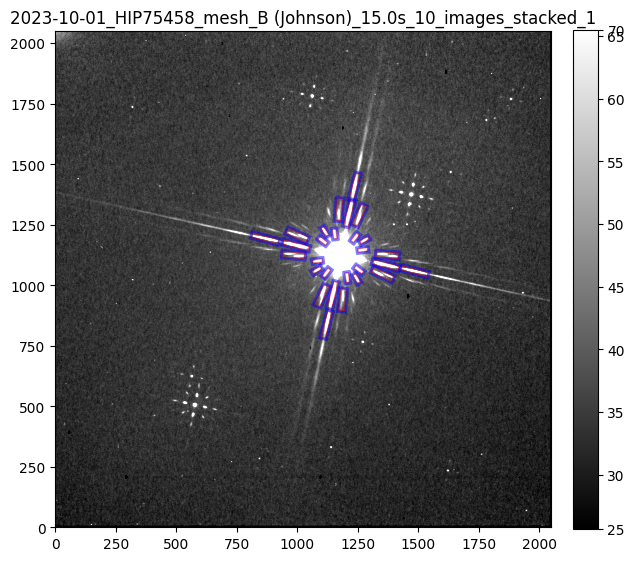

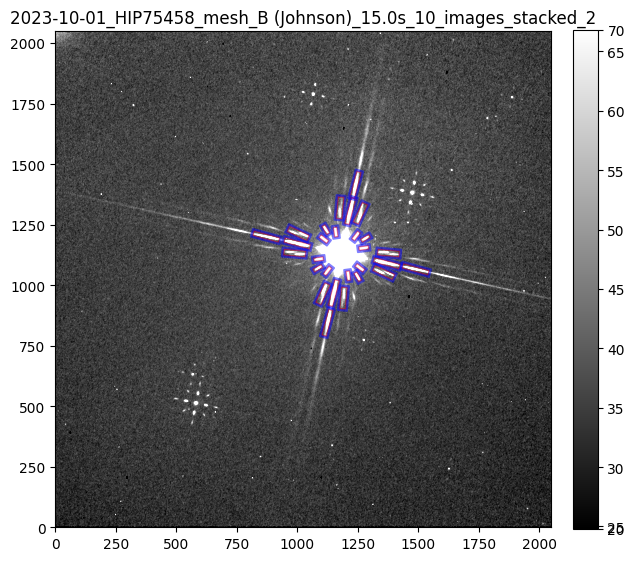

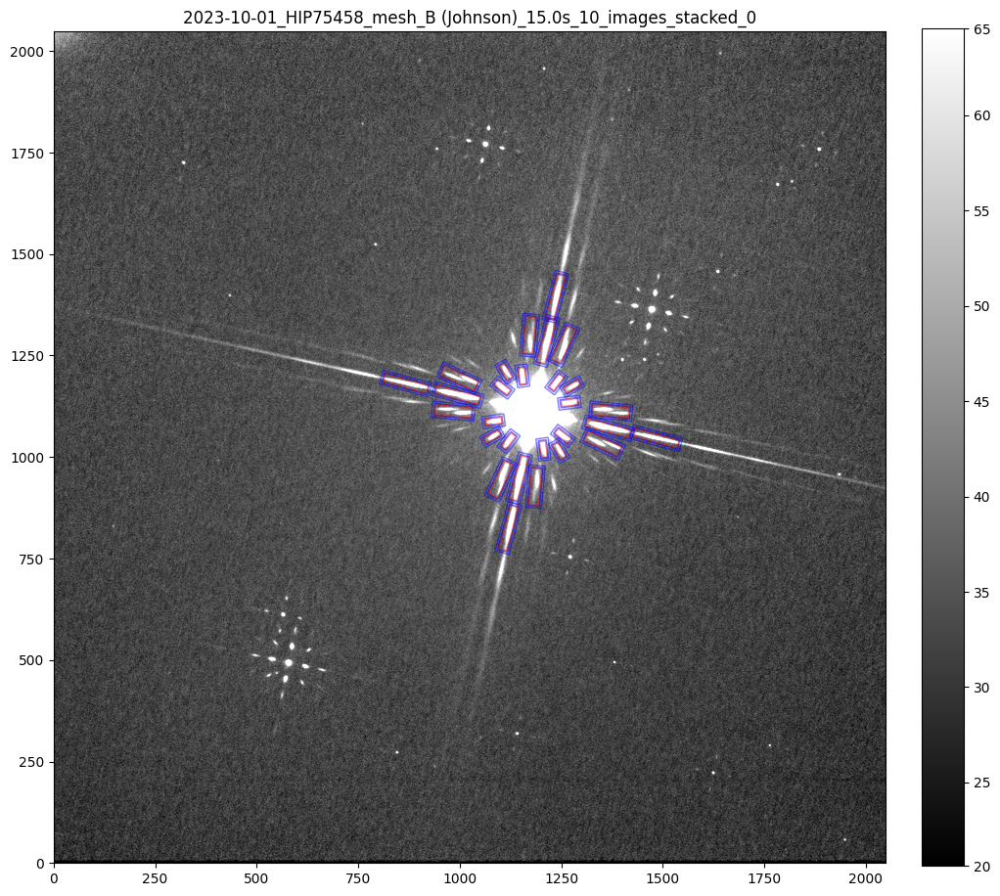

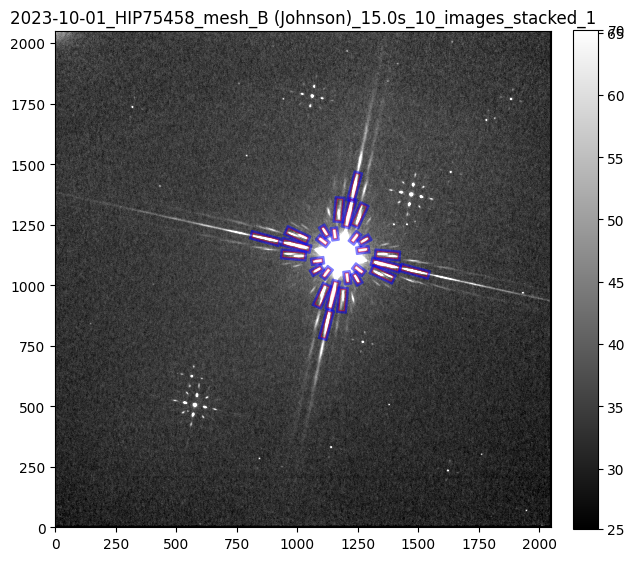

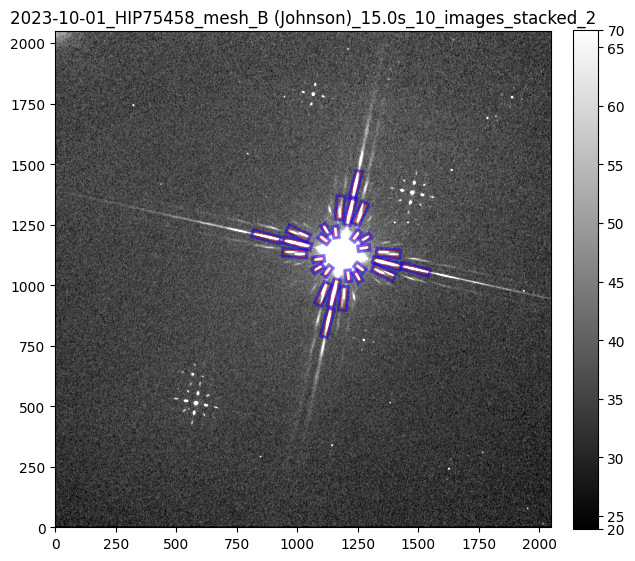

In [51]:
# use clicker.py
# define positon: corners from bottom left (bl) to ul, ur, br ;
                          #spikes next to corners, starting from above bl;
                          #outside spikes starting from bl
                          #outside spikes an very outside spike (outside l, v. outside l, o. u., v.o.u., ...)
# 10.01 75458 B 7.5 from image 0
'''bright_positions = [(1079, 1049), (1112, 1208), (1273, 1173), (1245, 1014),
                    (1083, 1088), (1103, 1172), (1152, 1203), (1236, 1183), (1273, 1133), (1255, 1052), (1205, 1019), (1124, 1035),
                    (982, 1112), (1002, 1193), (1171, 1298), (1256, 1291), (1369, 1110), (1349, 1034), (1185, 922), (1099, 943),
                    (991, 1151), (1210, 1284), (1353, 1074), (1143, 945), (866, 1181), (1234, 1402), (1487, 1046), (1118, 826)]'''

# 10.01 757458 B 7.5. from image 2
'''bright_positions = [(1084, 1074), (1116, 1234), (1280, 1197), (1249, 1036),
                    (1085, 1113), (1105, 1195), (1156, 1230), (1243, 1211), (1273, 1156), (1262, 1075), (1208, 1042), (1120, 1061),
                    (988, 1136), (1002, 1219), (1175, 1329), (1260, 1306), (1375, 1136), (1356, 1057), (1185, 949), (1102, 967), 
                    (996, 1177), (1215, 1307), (1366, 1097), (1145, 966), (879, 1202), (1237, 1415), (1491, 1069), (1123, 850)]'''

bright_positions = [(1080, 1050), (1113, 1210), (1277, 1174), (1245, 1015),
                    (1083, 1088), (1105, 1171), (1154, 1200), (1238, 1184), (1270, 1134), (1254, 1052), (1206, 1019), (1120, 1039), 
                    (984, 1113), (999, 1194), (1172, 1300), (1256, 1277), (1372, 1113), (1352, 1033), (1186, 927), (1101, 945), 
                    (995, 1153), (1214, 1286), (1365, 1071), (1146, 948), (867, 1181), (1236, 1395), (1484, 1046), (1120, 825)]

edge_list = [(57, 1371), (1347, 1995), (2032, 929), (998, 238)] # from left to up,r,b:  important for faint stars !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

rotation = -15 # angles are same evertime, picture is just rotated



theta_list = [Angle(angle+rotation, "deg") for angle in [45, 135, 45, 135,   
                                                      22.5, 157.5, 112.5, 67.5, 22.5, 157.5, 112.5, 67.5,
                                                      10,-10,100,80,10,-10,100,80,
                                                      0,90,0,90,0,90,0,90] ]

w_list = np.concatenate((40*np.ones(12), 90*np.ones(8), 110*np.ones(8))) #width of box (x)
h_list =  np.concatenate((15* np.ones(12), 25* np.ones(8), 20*np.ones(8)))#and hight of box (y)


def get_mag_bright(imageList):
    magnitude_list_bright = []
    pos_br = []
    for i,image in enumerate (imageList):
        if i == 0:
            fig, ax = plt.subplots(1, 1, figsize=(12, 12))
        else: 
            fig, ax = plt.subplots(1, 1, figsize=(7,7))
        show_image(image, fig=fig, ax=ax)
        ax.set_title(titles[i])
        shifted_positions = []
        for position in bright_positions:
            tuple = np.array((position[0]+shifts[i][0], position[1]+shifts[i][1]))
            #tuple = np.array((position[0], position[1]))
            shifted_positions.append(tuple)
        pos_br.append(shifted_positions)
        apertures_bright = [RectangularAperture(position, w=w, h=h, theta=theta) for position, theta, w, h in zip(shifted_positions, theta_list, w_list, h_list)]
        annuluses_bright = [RectangularAnnulus(position, w_in=w+5, w_out=w+15, h_in=h+5, h_out=h+15, theta=theta) for position, theta, w, h in zip(shifted_positions, theta_list, w_list, h_list)]
        for aperture in apertures_bright:
            aperture.plot(color="red", lw=1.0, alpha=0.5)
        for anulus in annuluses_bright:
            anulus.plot(color="blue", lw=1.0, alpha=0.5)

        phot_table_bright = Table(names=('id', 'xcenter', 'ycenter', 'aperture_sum', 'total_bkg'), dtype=('int', 'float', 'float', 'float', 'float'))
        for i in range(len(apertures_bright)):
            aperstats = ApertureStats(image, annuluses_bright[i])
            bkg = aperstats.median
            aperture_area = apertures_bright[i].area_overlap(image)
            total_bkg = bkg * aperture_area
            phot_table = aperture_photometry(image, apertures_bright[i])
            phot_table['total_bkg'] = total_bkg
            phot_table_bright.add_row([i, phot_table['xcenter'][0], phot_table['ycenter'][0], phot_table['aperture_sum'][0], phot_table['total_bkg'][0]])

        magnitudes=[]
        for row in phot_table_bright:
            magnitude =  - (2.5 * np.log10(abs(row['aperture_sum'] - row['total_bkg']) / exptime))
            magnitudes.append(magnitude)
        magnitude_list_bright.append(magnitudes)
        phot_table_bright['magnitude'] = magnitudes
        #phot_table_bright['magnitude'] = magnitude_bright
        #phot_table_bright.pprint(max_lines = -1, max_width = -1)
    mean_magnitude_list_bright = [np.mean(mag) for mag in magnitude_list_bright]
    print(mean_magnitude_list_bright)
    print(np.mean(mean_magnitude_list_bright),"+-", np.std(mean_magnitude_list_bright))
    return pos_br, magnitude_list_bright, mean_magnitude_list_bright

pos_br_mean, mag_br_mean, mean_mag_br_mean = get_mag_bright(image_list)
pos_br_median, mag_br_median, mean_mag_br_median = get_mag_bright(image_list_median)

94
30
30
30
[-6.4010663817678255, -6.408650745896288, -6.408760688599669]
0.003601496976623911
30
30
30
[-6.398139669768915, -6.400548739459116, -6.405196201549276]
0.0029287305065311183


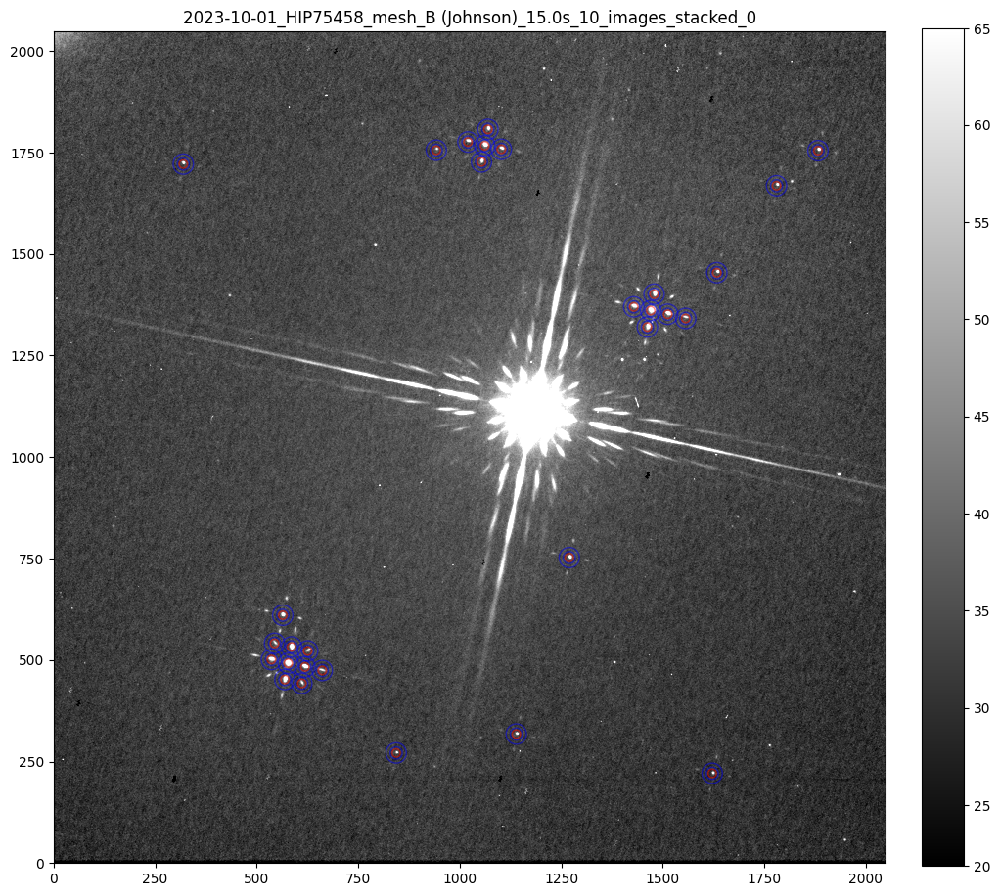

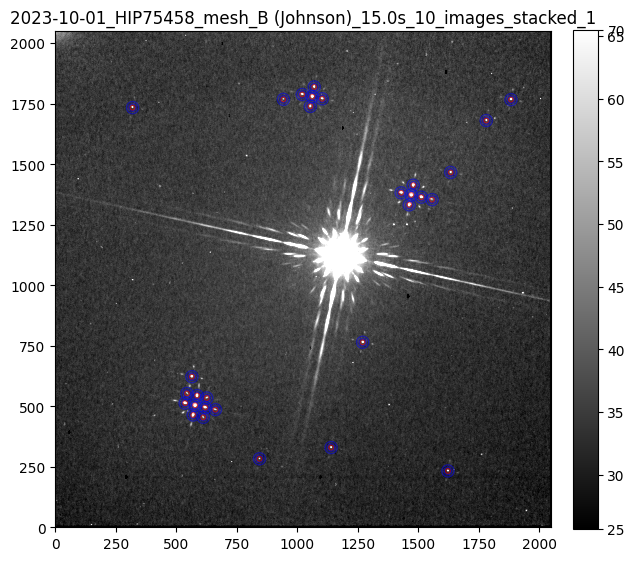

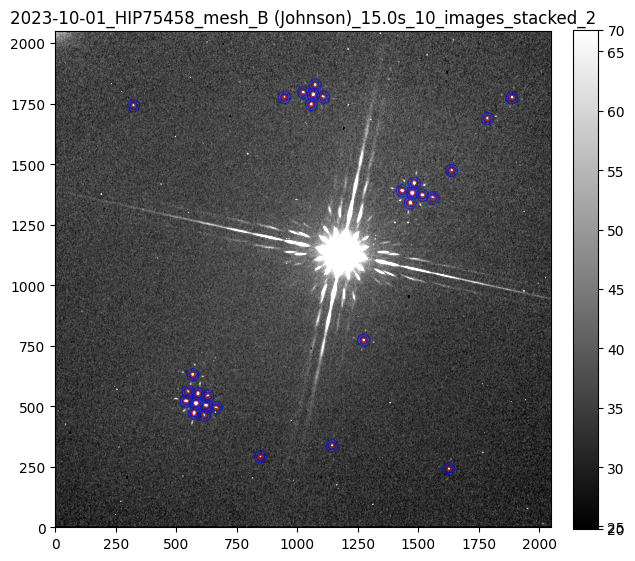

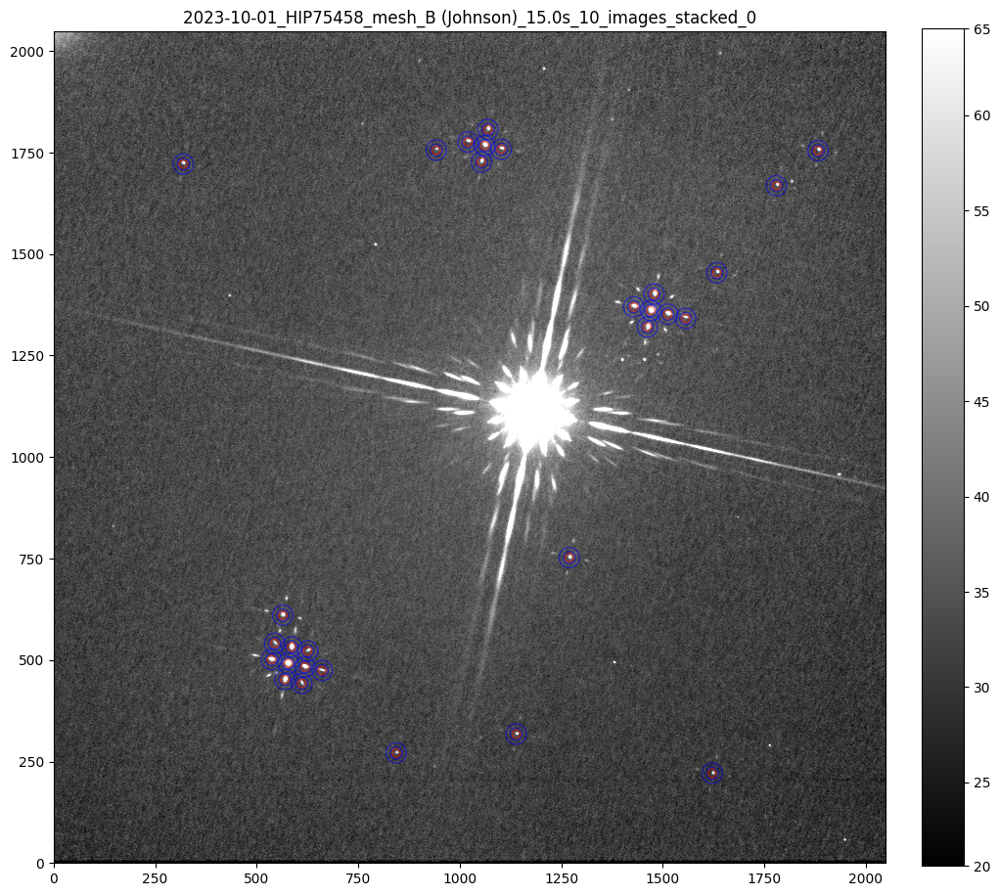

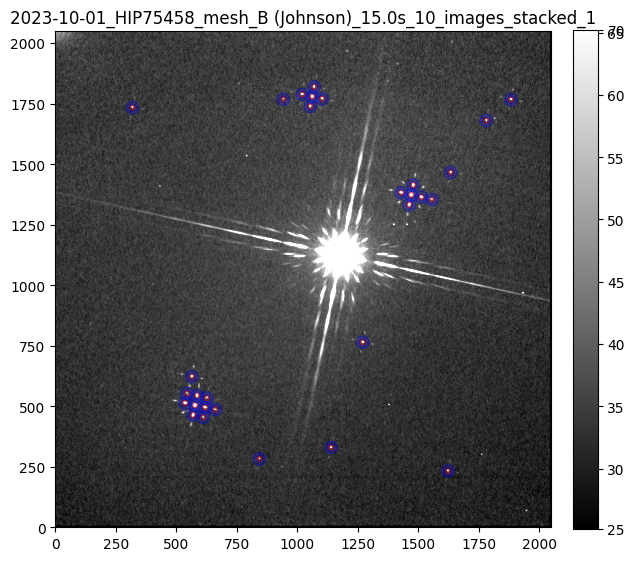

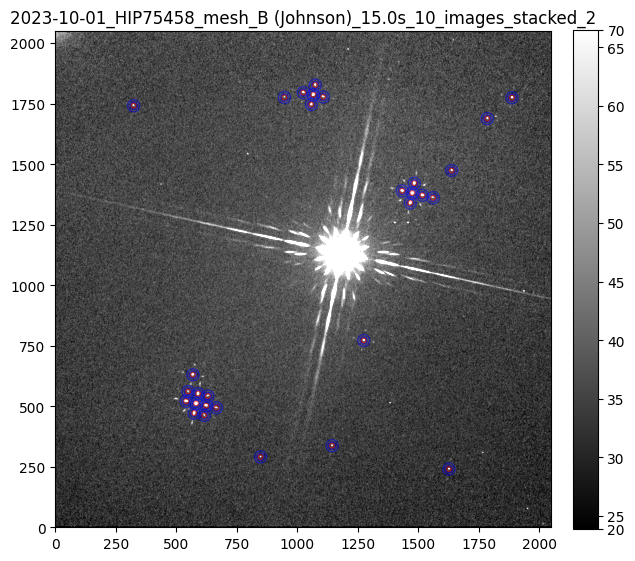

In [72]:
r_ft=10    #change here !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
top_n=30 #change number of stars here (count from brightest) !!!!!!!!!!!!!!!!!!!!!


# mask circle around center of target star
mask2 = np.zeros(image_list[0].shape, dtype=bool)
center = np.mean(pos_br_median[0], axis=0)#mean of all spikes should be the center
x, y = np.ogrid[:image_list[0].shape[1], :image_list[0].shape[0]]
circle_mask = np.sqrt((x - center[0]) ** 2 + (y - center[1]) ** 2) <= (350)
mask2[circle_mask] = True


# just for 10.01 B 15 rmove later !!!!!!!!!!!!!!!!!!!!!!!!!!!!!
center2 = (953, 1459)
x, y = np.ogrid[:image_list[0].shape[1], :image_list[0].shape[0]]
circle_mask2 = np.sqrt((x - center2[0]) ** 2 + (y - center2[1]) ** 2) <= (50)
mask2[circle_mask2] = True

#mask the spikes as triangles
def get_mask(triangle_corners):
    triangle_corners[:, [0, 1]] = triangle_corners[:, [1, 0]] #positions in y,x instead of x,y in programming
    y, x = np.ogrid[:image_list[0].shape[1], :image_list[0].shape[0]][::-1] #same here
    triangle_mask = ((x - triangle_corners[0, 0]) * (triangle_corners[1, 1] - triangle_corners[0, 1]) - (y - triangle_corners[0, 1]) * (triangle_corners[1, 0] - triangle_corners[0, 0]) > 0) & \
                    ((x - triangle_corners[1, 0]) * (triangle_corners[2, 1] - triangle_corners[1, 1]) - (y - triangle_corners[1, 1]) * (triangle_corners[2, 0] - triangle_corners[1, 0]) > 0) & \
                    ((x - triangle_corners[2, 0]) * (triangle_corners[0, 1] - triangle_corners[2, 1]) - (y - triangle_corners[2, 1]) * (triangle_corners[0, 0] - triangle_corners[2, 0]) > 0)
    return triangle_mask
for i in range (len(edge_list)):
    triangle_corners = np.array([edge_list[i], bright_positions[i], bright_positions[(i+1) % len(edge_list)]])
    triangle_mask = get_mask(triangle_corners)
    mask2[triangle_mask] = True


#detect ref stars in first image
mean, median, std = sigma_clipped_stats(image_list_median[0], sigma=3.0)
daofind_faint = DAOStarFinder(fwhm=3.0, threshold=4.0*std, roundlo=-5.0, roundhi=5.0)
sources_faint = daofind_faint(image_list_median[0], mask=mask2)
sources_faint.sort(['xcentroid', 'ycentroid'])
positions_faint = np.transpose((sources_faint['xcentroid'], sources_faint['ycentroid']))
positions_faint,sources_faint = filter_sources(positions_faint, sources_faint, min_separation=30, min_edge_distance=r_ft) #exclude multiple detections of star, min edge dist not relevant since we will shift pos

#filter pos which are too close to the ege
edge = 30
valid_positions = [pos for pos in positions_faint if all(edge < pos[0] + shift[-1] < 2048 - edge and edge < pos[1] + shift[-1] < 2048 - edge for shift in shifts)]
print(len(valid_positions))

def get_mag_faint(input_list, plotting = False):
    magnitude_list_faint, positions_faint = [],[]

    for i,image in enumerate (input_list):
        
        shifted_positions = []
        if i == 0:
            for position in valid_positions:
                tuple = np.array((position[0]+shifts[i][0], position[1]+shifts[i][1]))
                shifted_positions.append(tuple)
        else:
            for position in positions_faint[0]: # because we choose top_n in first image we need to stick to thoose positons, otherwise we would determine top_n new in everimage -> usage of different ref stars
                tuple = np.array((position[0]+shifts[i][0], position[1]+shifts[i][1]))
                shifted_positions.append(tuple)


        apertures_faint = [CircularAperture(position, r=r_ft) for position in shifted_positions]
        annulus_apertures_faint = [CircularAnnulus(position,r_in=r_ft+5, r_out=r_ft+15) for position in shifted_positions]
        
        # Initialize an empty table to store the photometry results
        phot_table_faint = Table(names=('id', 'xcenter', 'ycenter', 'aperture_sum', 'total_bkg'), dtype=('int', 'float', 'float', 'float', 'float'))
        for j in range(len(apertures_faint)):
            aperstats = ApertureStats(image, annulus_apertures_faint[j])
            bkg = aperstats.median
            aperture_area = apertures_faint[j].area_overlap(image)
            total_bkg = bkg * aperture_area
            phot_table = aperture_photometry(image, apertures_faint[j])
            phot_table['total_bkg'] = total_bkg
            phot_table_faint.add_row([j, phot_table['xcenter'][0], phot_table['ycenter'][0], phot_table['aperture_sum'][0], phot_table['total_bkg'][0]])
        #phot_table_faint.pprint(max_lines = -1, max_width = -1)

        magnitudes=[]
        for row in phot_table_faint:
            magnitude =  - (2.5 * np.log10(abs(row['aperture_sum'] - row['total_bkg']) / exptime))
            magnitudes.append(magnitude)
        

        sorted_indices = np.argsort(magnitudes)[:top_n]
        top_n_magnitudes = [magnitudes[idx] for idx in sorted_indices]
        top_n_positions = [shifted_positions[idx] for idx in sorted_indices]
        apertures_faint = [apertures_faint[idx] for idx in sorted_indices]
        annulus_apertures_faint = [annulus_apertures_faint[idx] for idx in sorted_indices]
        
        magnitude_list_faint.append(top_n_magnitudes)
        print(len(top_n_positions))
        positions_faint.append(top_n_positions)

        if plotting == True:
            if i == 0:
                fig, ax = plt.subplots(1, 1, figsize=(12, 12))
            else:
                fig, ax = plt.subplots(1,1, figsize=(7,7))
            show_image(image, fig=fig, ax=ax)
            ax.set_title(titles[i])
            for aperture in apertures_faint:
                aperture.plot(color="red", lw=1.0, alpha=0.5)
            for anulus in annulus_apertures_faint:
                anulus.plot(color="blue", lw=1.0, alpha=0.5)

    mean_faint_magnitudes_list = [np.mean(mag) for mag in magnitude_list_faint] #mean of all refernce stars
    print(mean_faint_magnitudes_list)
    print(np.std(mean_faint_magnitudes_list))
    return positions_faint, magnitude_list_faint, mean_faint_magnitudes_list

pos_ft_mean,    mag_ft_mean,    mean_mag_ft_mean    = get_mag_faint(image_list, plotting = True)
pos_ft_median,  mag_ft_median,  mean_mag_ft_median  = get_mag_faint(image_list_median, plotting = True)

# Diff Phot


In [73]:
def print_results(magnitude_list_bright,mean_faint_magnitudes_list):
  diff_magnitude_list = []
  print("index  bright mag        faint mag         diff mag")
  for index in range (len(image_list)):
    diff_magnitude= magnitude_list_bright[index] - mean_faint_magnitudes_list [index]
    print(index,  magnitude_list_bright[index] , mean_faint_magnitudes_list [index], diff_magnitude)
    diff_magnitude_list.append(diff_magnitude)
  print(f"The differential Magnitude is: M = {round(np.mean(diff_magnitude_list), 4)}err{round(np.std(diff_magnitude_list), 4)} mag")
  print(f"Value for bright star: {round(np.mean(magnitude_list_bright),4)}+-{round(np.std(magnitude_list_bright),4)}")
  print(f"Value for faint stars: {round(np.mean(mean_faint_magnitudes_list),4)}+-{round(np.std(mean_faint_magnitudes_list),4)}")
  
print('for mean:')
print_results(mean_mag_br_mean,  mean_mag_ft_mean)
print('')
print('for median:')
print_results(mean_mag_br_median,  mean_mag_ft_median)
print('')
print(f'rot={rotation} ; r_ft={r_ft} ; egde list={edge_list}, top_n={top_n}')

for mean:
index  bright mag        faint mag         diff mag
0 -8.873985544086194 -6.4010663817678255 -2.4729191623183686
1 -8.86414282904646 -6.408650745896288 -2.4554920831501716
2 -8.847856821495451 -6.408760688599669 -2.4390961328957825
The differential Magnitude is: M = -2.4558err0.0138 mag
Value for bright star: -8.862+-0.0108
Value for faint stars: -6.4062+-0.0036

for median:
index  bright mag        faint mag         diff mag
0 -8.875548546966062 -6.398139669768915 -2.4774088771971474
1 -8.862907747829238 -6.400548739459116 -2.4623590083701226
2 -8.847609815283532 -6.405196201549276 -2.4424136137342556
The differential Magnitude is: M = -2.4607err0.0143 mag
Value for bright star: -8.862+-0.0114
Value for faint stars: -6.4013+-0.0029

rot=-15 ; r_ft=10 ; egde list=[(57, 1371), (1347, 1995), (2032, 929), (998, 238)], top_n=30


# Save positons

In [74]:
output_path = path[:46] + 'results'
if not os.path.exists(output_path):
    os.makedirs(output_path)

time_list =[]
for i in range (len(header_list)):
    print(header_list[i]['DATE-OBS'])
    time_list.append(header_list[i]['DATE-OBS'])

file_name = f'time_list_{header_list[0]["DATE-OBS"][:10]}_ms_{header_list[0]["OBJECT"]}_{header_list[0]["FILTER"]}_{exptime}s.txt'
file_path = os.path.join(output_path, file_name) 
with open(file_path, 'w') as file:
    for item in time_list:
        file.write(f"{item}\n")

2023-10-01T20:02:53
2023-10-01T20:13:00
2023-10-01T20:20:09


In [75]:
def create_df(mag_mean, mag_median, pos_median, suffix, w=None, h=None):
    #creating df with mean mags
    df = pd.DataFrame({
        f'Mag_Mean_Im_{i+1}': mag for i, mag in enumerate(mag_mean)
    })

    # Adding mag_median to the df
    df = pd.concat([
        df,
        pd.DataFrame({
            f'Mag_Median_Im_{i+1}': mag for i, mag in enumerate(mag_median)
        })
    ], axis=1)

    # adding x,y pos
    x_values = [pos[0] for pos in pos_median[0]]
    y_values = [pos[1] for pos in pos_median[1]]
    df['x'] = x_values
    df['y'] = y_values
    df['x'] = df['x'].round(1)
    df['y'] = df['y'].round(1)
    if w is not None and h is not None:
        df['w'] = w
        df['h'] = h
    file_name = 'results_' + f'{header_list[0]["DATE-OBS"][:10]}_ms_{header_list[0]["OBJECT"]}_{header_list[0]["FILTER"]}_{exptime}s_{suffix}.csv'
    file_path = os.path.join(output_path, file_name) #output path defined above
    df.to_csv(file_path)
    display(df)
    return df

df_ft = create_df(mag_ft_mean, mag_ft_median, pos_ft_median, 'ref_stars')
df_br = create_df(mag_br_mean, mag_br_median, pos_br_median, 'target_star', w_list, h_list)




,Mag_Mean_Im_1,Mag_Mean_Im_2,Mag_Mean_Im_3,Mag_Median_Im_1,Mag_Median_Im_2,Mag_Median_Im_3,x,y
0,-9.191919,-9.184262,-9.181398,-9.177728,-9.179587,-9.178332,577.5,503.7
1,-9.042092,-9.037595,-9.036332,-9.032360,-9.031138,-9.036326,1470.2,1372.4
2,-7.835387,-7.845003,-7.815327,-7.831222,-7.846425,-7.819324,1061.4,1778.5
3,-7.405176,-7.395635,-7.381704,-7.402628,-7.399061,-7.389204,585.7,463.6
4,-7.402998,-7.380818,-7.377303,-7.400793,-7.381422,-7.382006,569.3,544.0
5,-7.295181,-7.291059,-7.310231,-7.296352,-7.284541,-7.283112,536.2,1413.0
6,-7.266446,-7.280168,-7.286641,-7.271436,-7.254064,-7.282218,1478.5,512.8
7,-7.254682,-7.254244,-7.278493,-7.256691,-7.233821,-7.258087,618.8,1331.8
8,-7.239873,-7.238472,-7.248053,-7.242937,-7.228262,-7.240758,1461.8,494.6
9,-7.142020,-7.132270,-7.117540,-7.137523,-7.134229,-7.120161,1512.0,1363.4


,Mag_Mean_Im_1,Mag_Mean_Im_2,Mag_Mean_Im_3,Mag_Median_Im_1,Mag_Median_Im_2,Mag_Median_Im_3,x,y,w,h
0,-7.240795,-7.215178,-7.097484,-7.235762,-7.224789,-7.110755,1080,1061.7,40.0,15.0
1,-7.705928,-7.715588,-7.721777,-7.719726,-7.706291,-7.741315,1113,1221.7,40.0,15.0
2,-7.231654,-7.227034,-7.185536,-7.207818,-7.225200,-7.133069,1277,1185.7,40.0,15.0
3,-7.721640,-7.727599,-7.686168,-7.718814,-7.725329,-7.692772,1245,1026.7,40.0,15.0
4,-9.295968,-9.289679,-9.267832,-9.298010,-9.291723,-9.268151,1083,1099.7,40.0,15.0
5,-9.546671,-9.541923,-9.529851,-9.547914,-9.538590,-9.527931,1105,1182.7,40.0,15.0
6,-8.971037,-8.961287,-8.952199,-8.979601,-8.958901,-8.946885,1154,1211.7,40.0,15.0
7,-9.264067,-9.261297,-9.245267,-9.267852,-9.259498,-9.246926,1238,1195.7,40.0,15.0
8,-9.316269,-9.304938,-9.300064,-9.321662,-9.304413,-9.305039,1270,1145.7,40.0,15.0
9,-9.554433,-9.537545,-9.539966,-9.554617,-9.533417,-9.534757,1254,1063.7,40.0,15.0


# Plot all together (for fun)


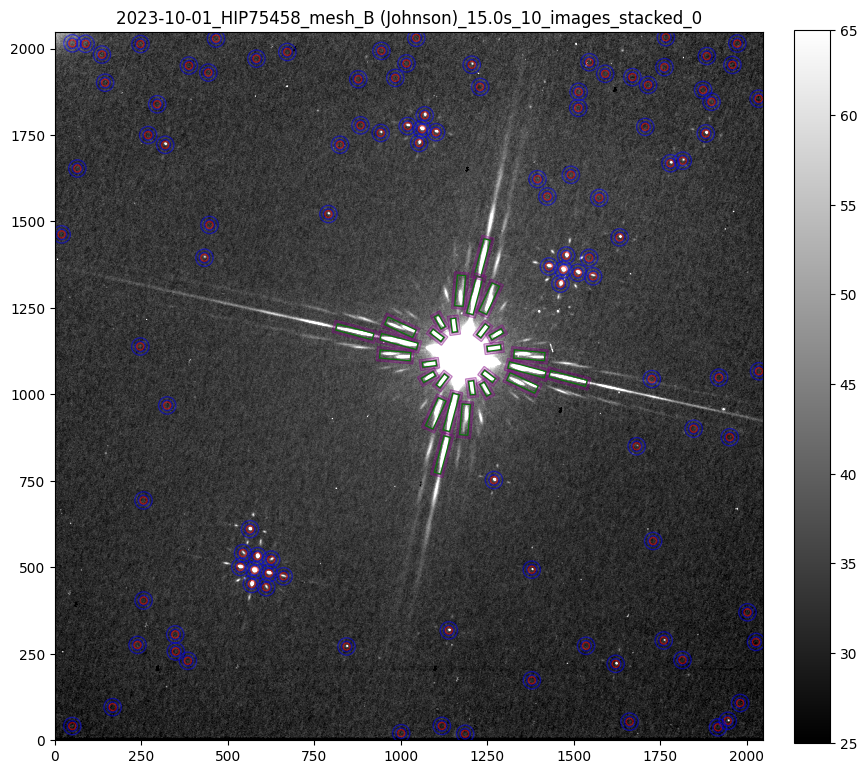

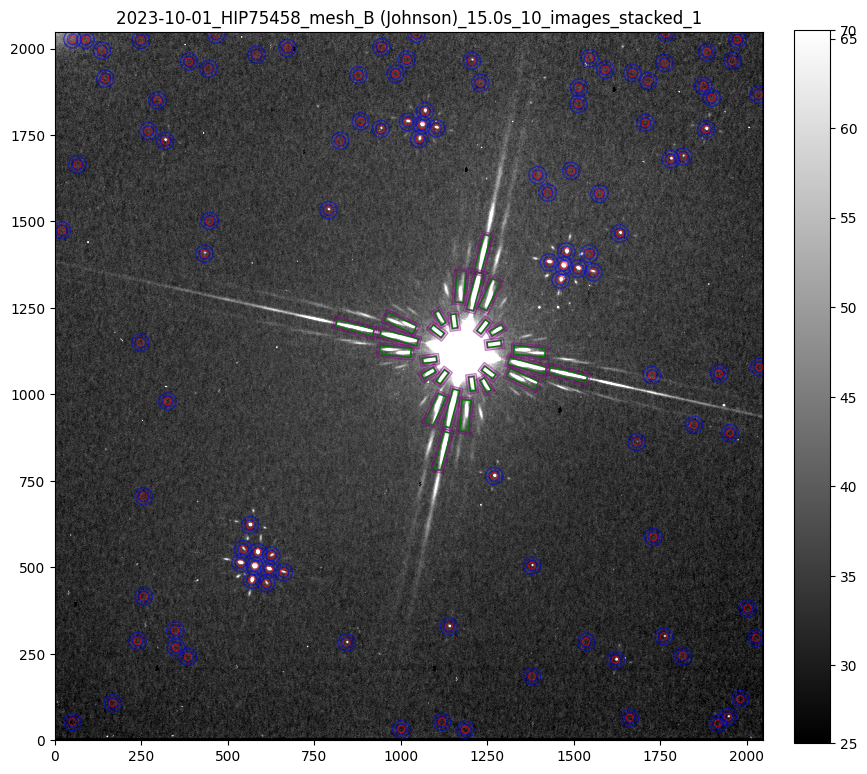

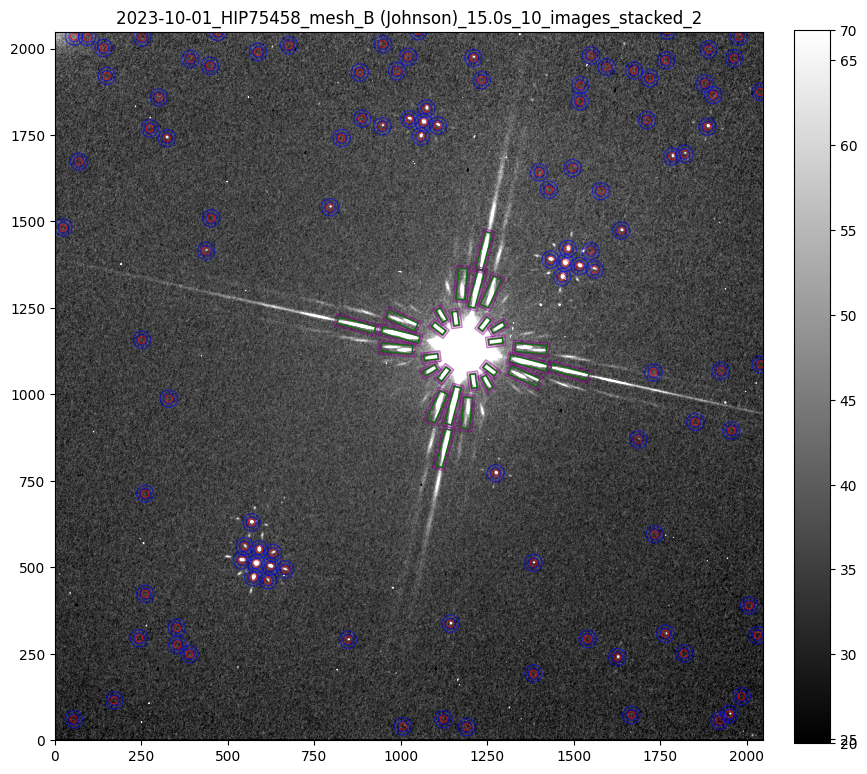

In [76]:
for i,image in enumerate (image_list):
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    show_image(image, fig=fig, ax=ax)
    ax.set_title(titles[i])
    shifted_positions = []
    for position in positions_faint:
        tuple = np.array((position[0]+shifts[i][0], position[1]+shifts[i][1]))
        shifted_positions.append(tuple)

    apertures_faint = [CircularAperture((x, y), r=r_ft) for (x, y) in shifted_positions]
    annulus_apertures_faint = [CircularAnnulus((x,y),r_in=r_ft+5, r_out=r_ft+15) for (x,y) in shifted_positions]
    for aperture in apertures_faint:
        aperture.plot(color="red", lw=1.0, alpha=0.5)
    for anulus in annulus_apertures_faint:
        anulus.plot(color="blue", lw=1.0, alpha=0.5)

    shifted_positions = []
    for position in bright_positions:
        tuple = np.array((position[0]+shifts[i][0], position[1]+shifts[i][1]))
        shifted_positions.append(tuple)

    apertures_bright = [RectangularAperture(position, w=w, h=h, theta=theta) for position, theta, w, h in zip(shifted_positions, theta_list, w_list, h_list)]
    annuluses_bright = [RectangularAnnulus(position, w_in=w+5, w_out=w+15, h_in=h+5, h_out=h+15, theta=theta) for position, theta, w, h in zip(shifted_positions, theta_list, w_list, h_list)]
    for aperture in apertures_bright:
        aperture.plot(color="green", lw=1.1, alpha=1.0)
    for anulus in annuluses_bright:
        anulus.plot(color="purple", lw=1.0, alpha=0.5)

In [ ]:
'''import datetime
output_path = "/home/finn/visual_Studio_Code/bachelorarbeit/"
current_date = datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S")

def write_data_to_text_file(bright_positions, theta_list, edge_list, output_filename, image_path):
    os.makedirs(output_path, exist_ok=True)
    #output_path = os.path.join(path, output_filename)
    with open(os.path.join(output_path, output_filename), 'a') as file:
        file.write("Date: " + current_date + "\n")
        file.write("path to file =" + str(image_path)+ "\n")
        file.write("bright_positions = " + str(bright_positions) + "\n")
        file.write("theta_list = " + str(theta_list) + "\n")
        file.write("edge_list = " + str(edge_list) + "\n")
        file.write("calc diff mag =" + str(np.mean(mean_magnitude_list_bright)) + "+-" + str(np.std(mean_magnitude_list_bright)) + "\n")
        file.write("\n")

write_data_to_text_file(bright_positions, theta_list, edge_list, "all_used_positions_mesh.txt", path)'''